In [1]:
# Import of basic libraries/packages.

import pandas as pd
import os
import numpy as np
import dask.dataframe as dd 
import warnings 
warnings.filterwarnings("ignore")

In [2]:
# File with variables of interest: last version: 27/02:

df_cct = pd.read_parquet("/home/onyxia/work/df_cct_final.parquet1")

In [3]:
# Data visualization: 

df_cct.head()

,User,Card,Year,Month,Day,Hours,Amount,Use Chip,Card Brand,Card Type,...,daily_amount,nb_daily_declines_card,nb_weekly_declines_card,nb_monthly_declines_card,bad_pin,insufficient_balance,hr_nbt/last_30d_av_hr_nbt,day_nbt/last_30d_av_day_nbt,last_3d_amt/nbt,Is Fraud?
0,0,0,2002,9,1,6,134.09,Swipe Transaction,Visa,Debit,...,134.09,0.0,0.0,0.0,0,0,1.000000,1.000000,134.090000,0
1,0,0,2002,9,1,6,38.48,Swipe Transaction,Visa,Debit,...,172.57,0.0,0.0,0.0,0,0,1.333333,1.333333,86.285000,0
2,0,0,2002,9,2,6,120.34,Swipe Transaction,Visa,Debit,...,120.34,0.0,0.0,0.0,0,0,0.750000,1.200000,97.636667,0
3,0,0,2002,9,2,17,128.95,Swipe Transaction,Visa,Debit,...,249.29,0.0,0.0,0.0,0,0,0.800000,1.142857,105.465000,0
4,0,0,2002,9,3,6,104.71,Swipe Transaction,Visa,Debit,...,104.71,0.0,0.0,0.0,0,0,0.833333,1.111111,105.314000,0


In [6]:
# Drop User:

df_cct =  df_cct.drop(["User"], axis = 1)

In [7]:
# Managing categorical variables for DBSCAN. 
# Avoiding the problem of hierarchy between modalities:
# https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.OneHotEncoder.html?fbclid=IwAR2eCoPI9skUHDegZeP31K--Psh2thHY_5anQPtngWD6qU3caG1UxFdwtR4
# We use One Encoder. 
# Package sklearn.preprocessing. 
# The interesting modalities are recoded in the form of dummies.

In [8]:
from sklearn.preprocessing import OneHotEncoder

# Ex : We begin with the variable "Use Chip". 
# (To do:  "Merchant State", 'day_of_week', "Card Brand", "Card Type")

# For "Use Chip": (we keep all modalities)

enc = OneHotEncoder(handle_unknown='ignore')

features_array = enc.fit_transform(df_cct[["Use Chip"]]).toarray()

features_labels = np.hstack(np.array(enc.categories_))

df_cct = pd.concat([df_cct, pd.DataFrame(features_array, columns = features_labels)], axis = 1)


In [9]:
# For "Merchant State": (we keep only the 10 more common modalities)

enc = OneHotEncoder(handle_unknown='ignore',  max_categories=10)

features_array = enc.fit_transform(df_cct[["Merchant State"]]).toarray()

features_labels = np.array(enc.get_feature_names_out())

df_cct = pd.concat([df_cct, pd.DataFrame(features_array, columns = features_labels)], axis = 1)


In [10]:
# => Merchant City : too precise, not very interesting:

df_cct =  df_cct.drop(["Merchant City"], axis = 1)

In [11]:
# For 'day_of_week': (we keep all modalities)

enc = OneHotEncoder(handle_unknown='ignore')

features_array = enc.fit_transform(df_cct[['day_of_week']]).toarray()

features_labels = np.hstack(np.array(enc.categories_))

df_cct = pd.concat([df_cct, pd.DataFrame(features_array, columns = features_labels)], axis = 1)

In [12]:
# For "Card Brand": (we keep all modalities)

enc = OneHotEncoder(handle_unknown='ignore')

features_array = enc.fit_transform(df_cct[["Card Brand"]]).toarray()

features_labels = np.hstack(np.array(enc.categories_))

df_cct = pd.concat([df_cct, pd.DataFrame(features_array, columns = features_labels)], axis = 1)

In [13]:
# For "Card Type": (we keep all modalities)

enc = OneHotEncoder(handle_unknown='ignore')

features_array = enc.fit_transform(df_cct[["Card Type"]]).toarray()

features_labels = np.hstack(np.array(enc.categories_))

df_cct = pd.concat([df_cct, pd.DataFrame(features_array, columns = features_labels)], axis = 1)

In [14]:
# We no longer need these 5 categorical variables, we have reprocessed them.

df_cct =  df_cct.drop(["Card Brand", "Use Chip", 'day_of_week', "Card Type", "Merchant State"], axis = 1)

# The "Card" variable is also removed: no interest for clustering. 
# We wish to study the types of transaction in a general way.
df_cct =  df_cct.drop(["Card" ], axis = 1)


In [18]:
# Importing libraries for CPA and DBSCAN.

import pandas.util.testing as tm
import seaborn as sns
from sklearn import cluster 
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
from collections import Counter

In [19]:
# Problem of computing power we do DBSCAN only on 200 000 randomly drawn transactions. 
# Otherwise the Kernel dies.... 
# Important: New idea: => over-represent frauds to be able to interpret something. 
# We'll take 5% of frauds: 10000 out of the 200000 sample.
# We randomly select the frauds and non frauds and mix the sample.

df_cct1 = df_cct.copy()
# Fraud : 
df_cct_fraud = df_cct[df_cct['Is Fraud?'] == 1 ]
df_cct_non_fraud = df_cct[df_cct['Is Fraud?'] == 0 ]
#len(df_cct_fraud)
ech1 = df_cct_fraud.sample(10000)
ech2 = df_cct_non_fraud.sample(190000)
df_cct =  pd.concat([ech1, ech2], axis = 0)
df_cct = df_cct.sample(200000)

In [20]:
# We want to do clustering to extract information: goal: frauds. 
# We therefore remove the variable "Is Fraud? :

df_cct =  df_cct.drop(["Is Fraud?"], axis = 1)

In [23]:
# Implementation of DBSCAN : 

# Questioning ? Which distance to use? Cosine or Euclidean? 

# Which distance to use with DBSCAN? Cosine vs. Euclidean :
# The Euclidean distance is the L2 norm of a difference between vectors. 
# The cosine similarity is proportional to the dot product of two vectors and inversely proportional to the product of their magnitudes. 
# The cosine similarity is inversely proportional to the product of their magnitudes. (angle)
# Vectors with a small Euclidean distance from each other are located in the same region 
# of a vector space. Vectors with high cosine similarity 
# are located in the same general direction from the origin.
# Cosine: This is therefore a judgement of orientation and not of magnitude:  
# two vectors with the same orientation have a 
# two vectors with the same orientation have a cosine of 1, two vectors oriented at 90° to each other have a 
# Two vectors with the same orientation have a cosine of 1, two vectors oriented at 90° to each other have a cosine of 0, and two diametrically opposed vectors have a similarity of -1, 
# Regardless of their magnitude.
# While cosine is concerned with the angle between the vectors 
# (regardless of their weight or magnitude), 
# the Euclidean distance is similar to using a ruler to measure distance.

# We will use the Euclidean distance in the following:

In [26]:
# 1. - Normalise the variables of amounts and numbers of transactions only (leave dummies as they are) 
# Variables with amounts: 'amt/daily_income', 'daily_amount', 'last_3d_amt/nbt', 'Amount', 'Credit Limit'. 

df_cct['amt/daily_income'] = (df_cct['amt/daily_income']-np.mean(df_cct['amt/daily_income']))/np.std(df_cct['amt/daily_income'])

df_cct['daily_amount'] = (df_cct['daily_amount']-np.mean(df_cct['daily_amount']))/np.std(df_cct['daily_amount'])

df_cct['last_3d_amt/nbt'] = (df_cct['last_3d_amt/nbt']-np.mean(df_cct['last_3d_amt/nbt']))/np.std(df_cct['last_3d_amt/nbt'])

df_cct['Amount'] = (df_cct['Amount']-np.mean(df_cct['Amount']))/np.std(df_cct['Amount'])

df_cct['Credit Limit'] = (df_cct['Credit Limit']-np.mean(df_cct['Credit Limit']))/np.std(df_cct['Credit Limit'])


In [27]:
# We will also centre reduce these variables: 'delta_t_s', 'delta_t_s_card', 'nb_daily_declines_card'
# 'hr_nbt/last_30d_av_hr_nbt', 'nb_weekly_declines_card', 'nb_monthly_declines_card' 
# (variables nb of transactions) 
# 'day_nbt/last_30d_av_day_nbt

df_cct['delta_t_s'] = (df_cct['delta_t_s']-np.mean(df_cct['delta_t_s']))/np.std(df_cct['delta_t_s'])

df_cct['delta_t_s_card'] = (df_cct['delta_t_s_card']-np.mean(df_cct['delta_t_s_card']))/np.std(df_cct['delta_t_s_card'])

df_cct['nb_daily_declines_card'] = (df_cct['nb_daily_declines_card']-np.mean(df_cct['nb_daily_declines_card']))/np.std(df_cct['nb_daily_declines_card'])

df_cct['nb_weekly_declines_card'] = (df_cct['nb_weekly_declines_card']-np.mean(df_cct['nb_weekly_declines_card']))/np.std(df_cct['nb_weekly_declines_card'])

df_cct['nb_monthly_declines_card'] = (df_cct['nb_monthly_declines_card']-np.mean(df_cct['nb_monthly_declines_card']))/np.std(df_cct['nb_monthly_declines_card'])

df_cct['hr_nbt/last_30d_av_hr_nbt'] = (df_cct['hr_nbt/last_30d_av_hr_nbt']-np.mean(df_cct['hr_nbt/last_30d_av_hr_nbt']))/np.std(df_cct['hr_nbt/last_30d_av_hr_nbt'])

df_cct['day_nbt/last_30d_av_day_nbt'] = (df_cct['day_nbt/last_30d_av_day_nbt']-np.mean(df_cct['day_nbt/last_30d_av_day_nbt']))/np.std(df_cct['day_nbt/last_30d_av_day_nbt'])


In [28]:
# 2. - Delete the date fields.
# 'Month', 'Day', 'Hours' (The 'day of the week' dummies are reserved.)

df_cct =  df_cct.drop(['Month', 'Day', 'Hours', "Year", 'Year PIN last Changed'], axis = 1)

In [30]:
# Reformatting the data to apply DBSCAN.

X = df_cct.values
X.astype(np.float64)

array([[-0.29858849, -0.24113906,  0.09548537, ...,  0.        ,
         1.        ,  0.        ],
       [ 0.38167858, -0.14155057, -0.04873681, ...,  0.        ,
         1.        ,  0.        ],
       [-1.48880973, -0.58579252, -0.05025494, ...,  0.        ,
         1.        ,  0.        ],
       ...,
       [-0.43422623, -0.89138361, -0.04377759, ...,  0.        ,
         1.        ,  0.        ],
       [ 0.23947771,  0.43122714, -0.04812956, ...,  1.        ,
         0.        ,  0.        ],
       [-0.49865417,  0.94076493, -0.0474211 , ...,  0.        ,
         1.        ,  0.        ]])

In [31]:
# Now that we have our dataset, we will try to determine the "optimal" ε. 
# and the "optimal" Min_sample (=> interesting).
# We want 90 to 95% of the observations to have at least 5 neighbours in their epsilon-neighbourhood. 
# We want to avoid too many outliers. 
# We start with a min_sample of 5.

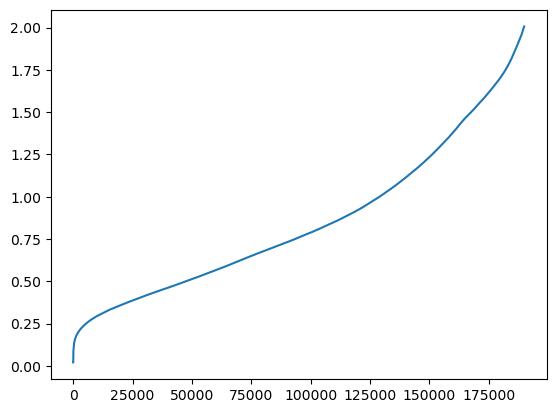

In [32]:
# Scikit-Learn provides a NearestNeighbors class which allows to determine 
# the nearest neighbours of each observation as well as the distances. 

%matplotlib inline
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
import numpy as np

neigh = NearestNeighbors(n_neighbors=5)
nbrs = neigh.fit(X)
distances, indices = nbrs.kneighbors(X)
distances = np.sort(distances, axis=0)
distances = distances[:190000,1]
plt.plot(distances);

# Conclusion: take eps = 1.5, 1.6, 1.7, 1.8, 1.9, 2, 2.1, 2.2 so that at least 95% of the observations belong to a group for a min_sample = 5. 
# observations belong to a cluster for min_sample = 5. 
# We want at least 90% of the 200,000 transactions to be in a cluster. 
# => Purpose of this piece of code: to avoid having too many outliers: gives the number 
# of points that are in a cluster.

# https://datascientest.com/machine-learning-clustering-dbscan 

<Axes: >

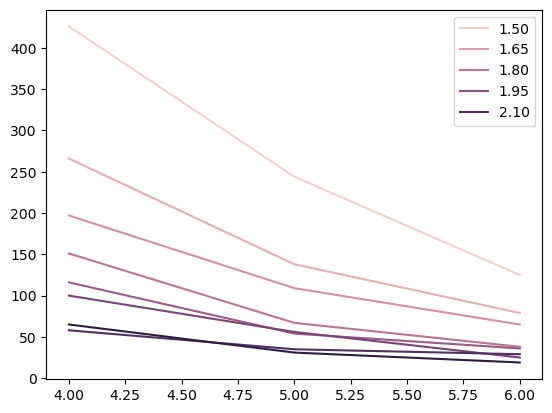

In [33]:
 # Choice of min_samples: We test eps around 1.5, 1.6, 1.7, 1.8, 1.9, 2, 2.1, 2.2 with min_sample = 4 or 5 or 6.

Eps = [1.5, 1.6, 1.7, 1.8, 1.9, 2, 2.1, 2.2]
Sample = [4,5,6]
N=[]
x = []
hue = []
for sample in Sample:
  for eps in Eps:
    clustering=cluster.DBSCAN(eps, min_samples=sample, n_jobs = -1)
    clustering.fit(X)
    labels=clustering.labels_
    n=np.unique(labels)
    N+=[len(n)]
    x.append(eps) 
    hue.append(sample)
sns.lineplot(x= hue,y=N, hue = x)

# The number of groups created is displayed:

In [34]:
# Interesting choice for eps and min_samples: (1.5 and 5):

clustering=cluster.DBSCAN(eps=1.5, min_samples=5, n_jobs = -1)
clustering.fit(X)
len(np.unique(clustering.labels_))

# Number of groups:

244

In [422]:
labels = clustering.labels_
d = Counter(labels)
d[-1]

# Number of outliers for this choice of eps and min_sample : 
# Approximately 10%.

52989

In [423]:
# We are going to do two methods of dimension reduction: PCA and UMAP. 

# We start with PCA. 

# PCA: dimension reduction => represent the DBSCAN method (point cloud)
# We use the 2 most representative dimensions of the sample (dim 1 and dim 2, the dimensions with the largest eigenvalues) 
# with the largest eigenvalues). 

pca = PCA()
pca.fit(df_cct)
df_cct.columns = df_cct.columns.astype("str")
df_cct_pca = pca.transform(df_cct)
df_cct_pca_df = pd.DataFrame({
    "Dim1" : df_cct_pca[:,0], 
    "Dim2" : df_cct_pca[:,1]})
df_cct_pca_df["labels"] = clustering.labels_

In [424]:
# To show the eigenvalues on the PCA.  => Interpret / understand the + representative axes ?

eig = pd.DataFrame(
    {
        "Dimension" : ["Dim" + str(x + 1) for x in range(len(pca.explained_variance_))], 
        "Variance expliquée" : pca.explained_variance_,
        "% variance expliquée" : np.round(pca.explained_variance_ratio_ * 100),
        "% cum. var. expliquée" : np.round(np.cumsum(pca.explained_variance_ratio_) * 100)
    }
)
eig

,Dimension,Variance expliquée,% variance expliquée,% cum. var. expliquée
0,Dim1,2.325489e+00,15.0,15.0
1,Dim2,1.701560e+00,11.0,26.0
2,Dim3,1.417232e+00,9.0,35.0
3,Dim4,1.069967e+00,7.0,42.0
4,Dim5,1.015914e+00,7.0,49.0
5,Dim6,9.912946e-01,6.0,55.0
6,Dim7,9.448401e-01,6.0,61.0
7,Dim8,7.558804e-01,5.0,66.0
8,Dim9,6.126566e-01,4.0,70.0
9,Dim10,5.743447e-01,4.0,74.0


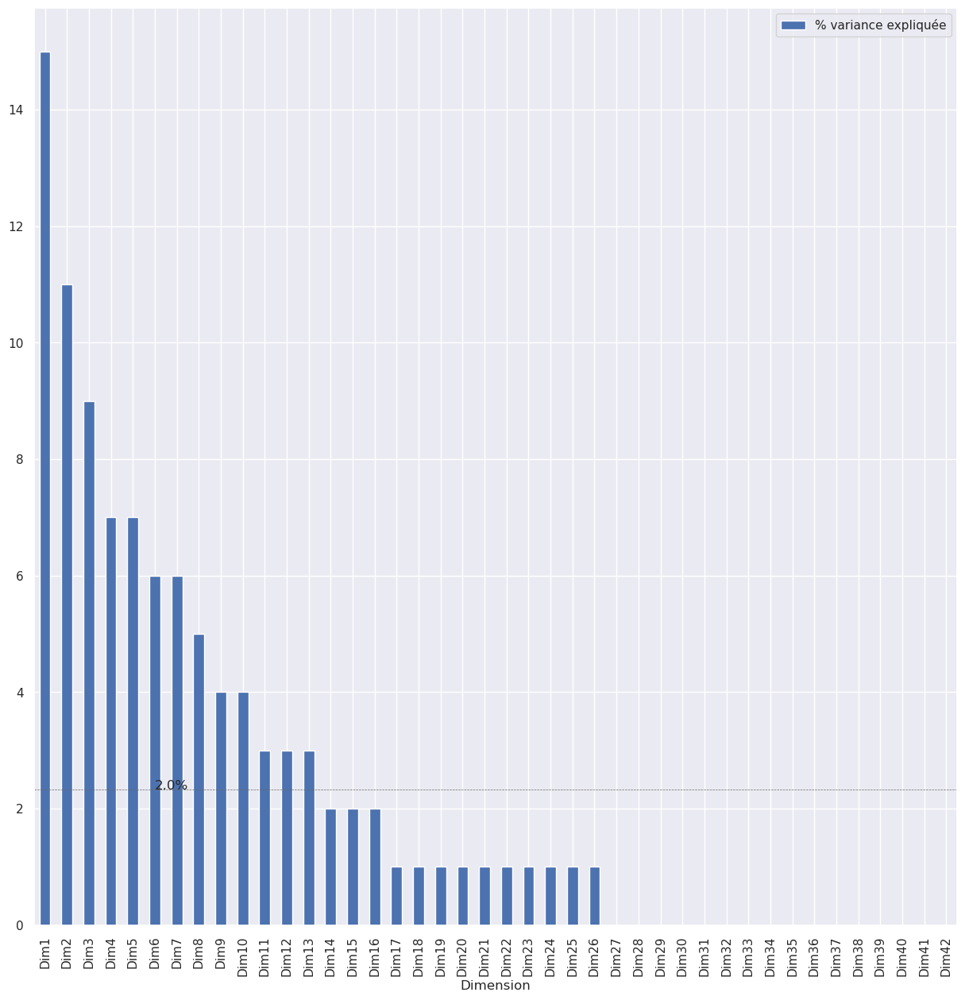

In [425]:
import matplotlib.pyplot as plt

eig.plot.bar(x = "Dimension", y = "% variance expliquée") 
plt.text(5, 100/(len(pca.explained_variance_)+1), str(np.round(100/(len(pca.explained_variance_)+1)))+"%") 
plt.axhline(y = (100/(len(pca.explained_variance_)+1)), linewidth = .5, color = "dimgray", linestyle = "--") 
plt.show()

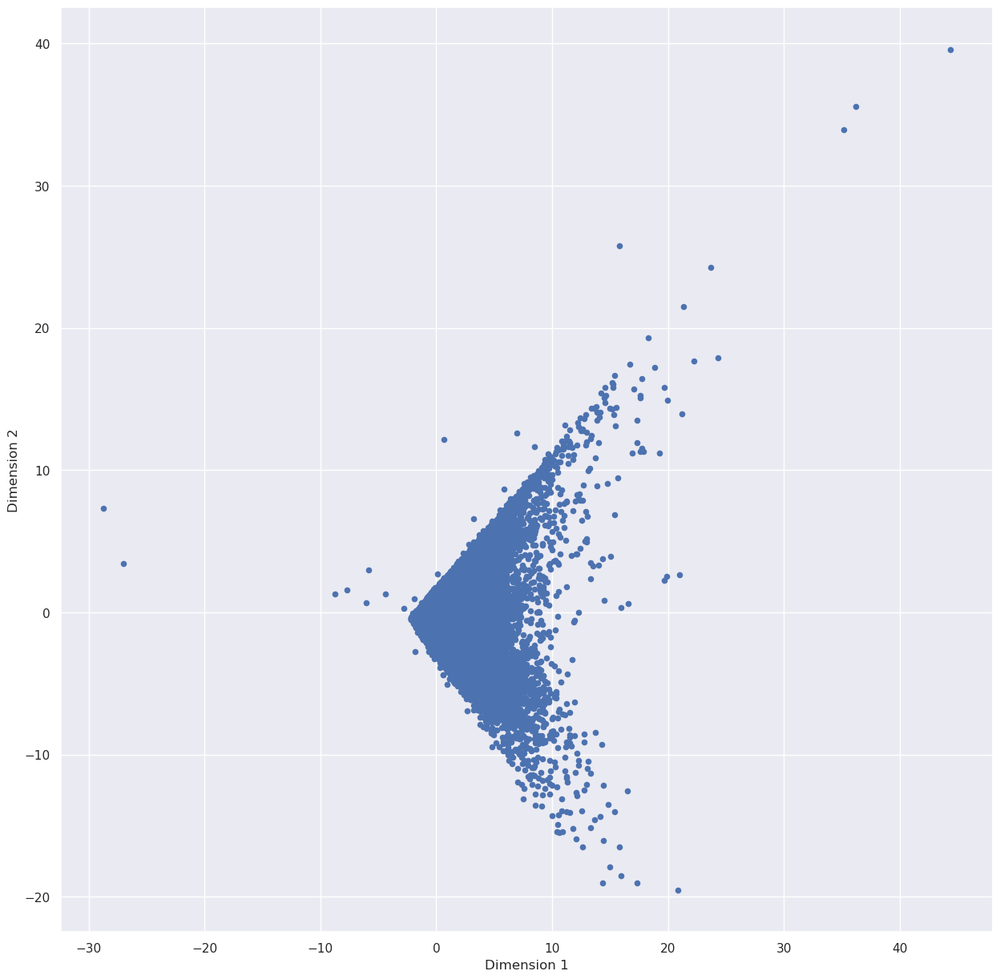

In [426]:
# PCA representation:

import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(15, 15))
df_cct_pca_df.plot.scatter("Dim1", "Dim2", ax = ax)
plt.xlabel("Dimension 1") 
plt.ylabel("Dimension 2")
plt.show()

<Axes: xlabel='Dim1', ylabel='Dim2'>

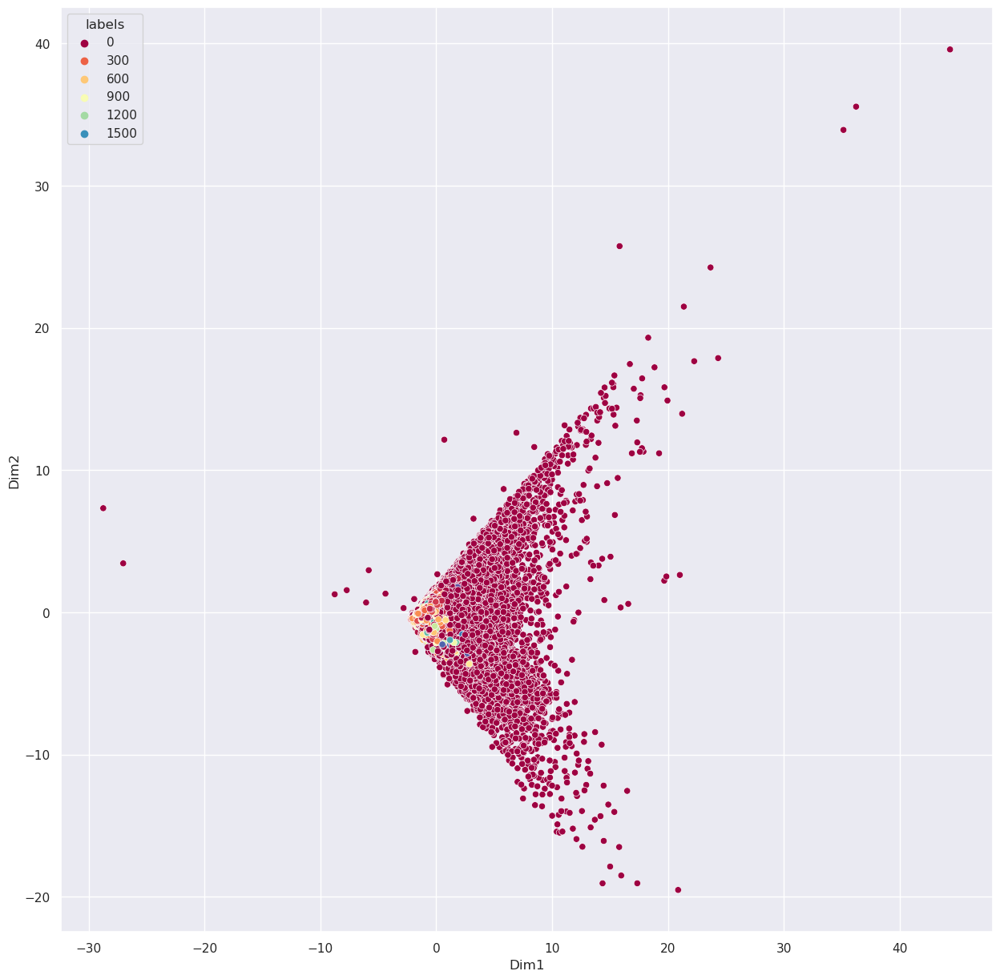

In [427]:
# Representation of DBSCAN with PCA:

sns.set(rc = {'figure.figsize':(15,15)})
sns.scatterplot(data = df_cct_pca_df, x = "Dim1", y = "Dim2", hue = df_cct_pca_df["labels"], palette="Spectral")

In [428]:
# Displaying the correlation circle to interpret the PCA axes:

n = df_cct.shape[0] # nb individuals
p = df_cct.shape[1] # nb variables
eigval = (n-1) / n * pca.explained_variance_ # eigenvalues
sqrt_eigval = np.sqrt(eigval)
corvar = np.zeros((p,p)) 
for k in range(p):
    corvar[:,k] = pca.components_[k,:] * sqrt_eigval[k]
coordvar = pd.DataFrame({'id': df_cct.columns, 'COR_1': corvar[:,0], 'COR_2': corvar[:,1]})
coordvar

,id,COR_1,COR_2
0,Amount,0.435674,0.484213
1,Credit Limit,0.150492,0.078023
2,delta_t_s,-0.095350,0.010876
3,delta_t_s_card,-0.101612,0.023843
4,amt/daily_income,0.028979,0.059383
5,Retired,0.000141,0.001163
6,daily_amount,0.783663,0.345504
7,nb_daily_declines_card,0.490535,-0.429638
8,nb_weekly_declines_card,0.547640,-0.680419
9,nb_monthly_declines_card,0.480640,-0.628057


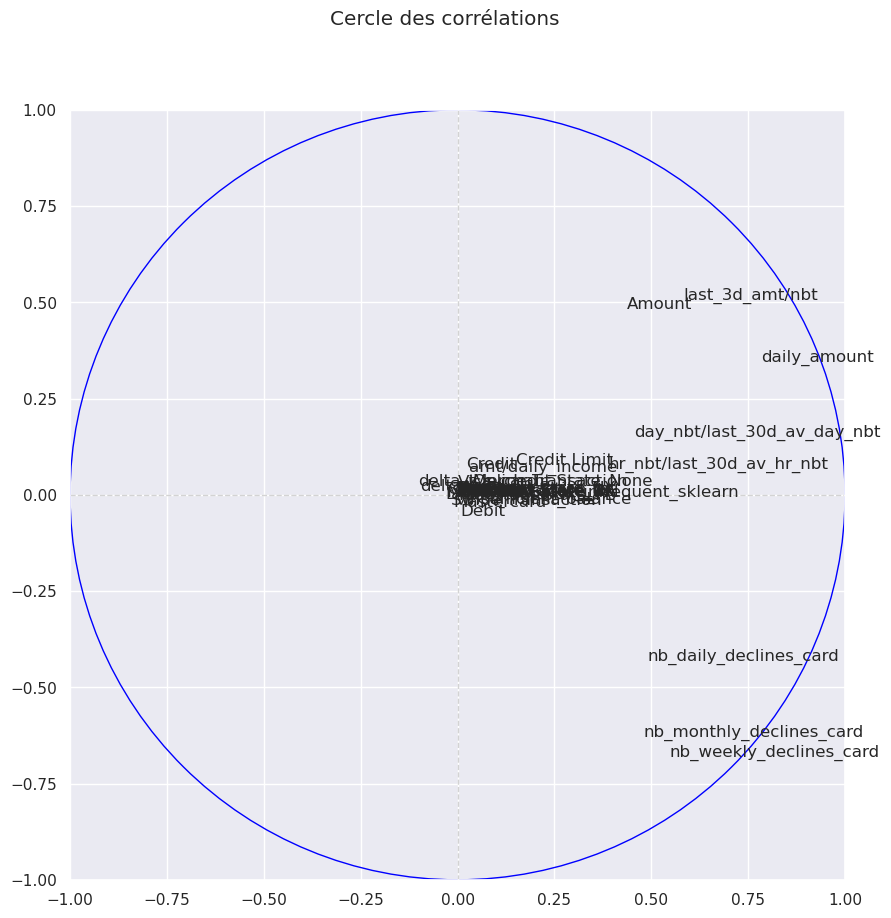

In [429]:
fig, axes = plt.subplots(figsize = (10,10))
fig.suptitle("Cercle des corrélations")
axes.set_xlim(-1, 1)
axes.set_ylim(-1, 1)
axes.axvline(x = 0, color = 'lightgray', linestyle = '--', linewidth = 1)
axes.axhline(y = 0, color = 'lightgray', linestyle = '--', linewidth = 1)
for j in range(p):
    axes.text(coordvar["COR_1"][j],coordvar["COR_2"][j], coordvar["id"][j])
plt.gca().add_artist(plt.Circle((0,0),1,color='blue',fill=False))
plt.show()

In [430]:
# 3D:
pca = PCA(n_components=3)
pca.fit(df_cct)
df_cct.columns = df_cct.columns.astype("str")
df_cct_pca = pca.transform(df_cct)
df_cct_pca_df = pd.DataFrame({
    "Dim1" : df_cct_pca[:,0], 
    "Dim2" : df_cct_pca[:,1], "Dim3" : df_cct_pca[:,2]})
df_cct_pca_df["labels"] = clustering.labels_

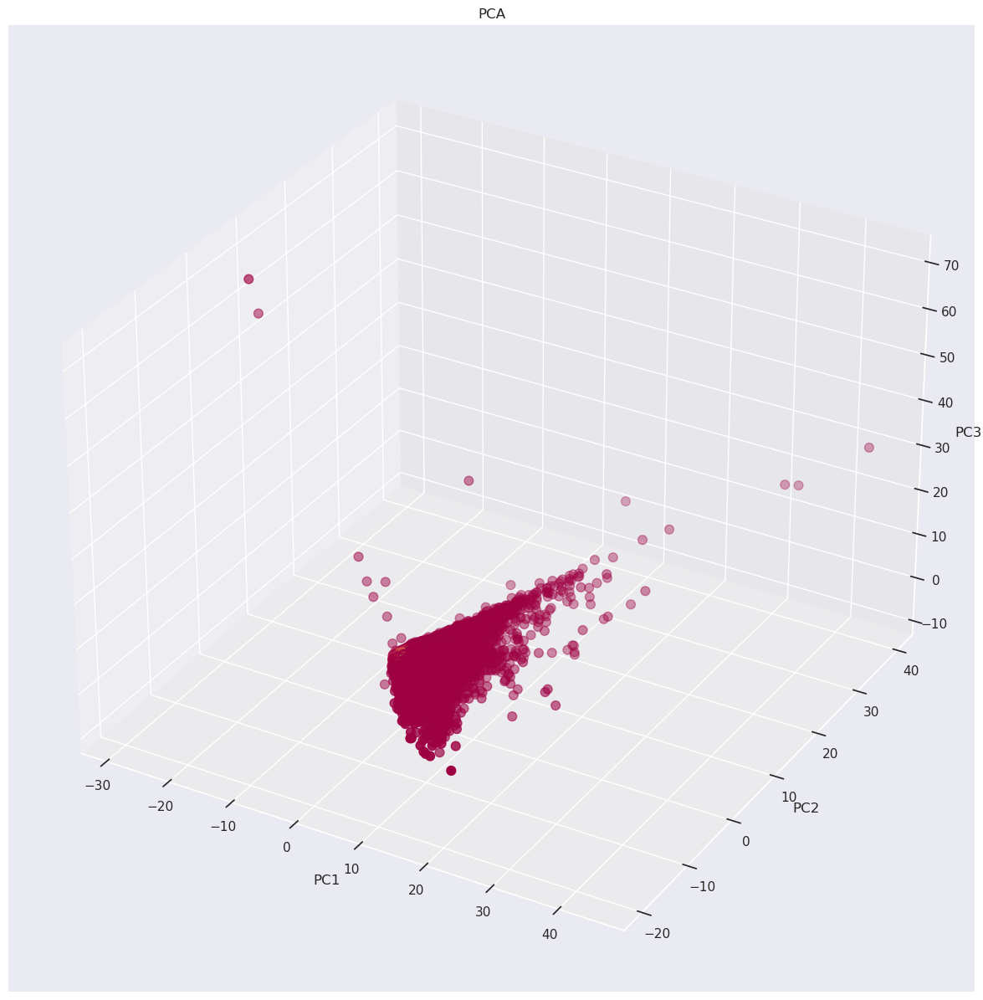

In [431]:
# Representation of DBSCAN with 3D PCA:

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df_cct_pca_df["Dim1"], df_cct_pca_df["Dim2"], df_cct_pca_df["Dim3"], c=df_cct_pca_df["labels"], cmap="Spectral", s=60)
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
ax.set_title("PCA")
plt.show()

In [432]:
# Interpretation of the correlation circle : 
    # The "goods" variables explained by the PCA are: 
    # hr-nbt/last\_30d\_av\_hr\_nbt, nb\_daily\_declines\_card, daily\_amount, last\_3d\_amt/nbt, 
    # Amount, delta_t\_s, delta_t\_s\_card. 
    # The horizontal axis: the rightmost points represent transactions 
    # with high amounts. On the left, the reverse is true. 
    # The vertical axis: top: frequency of large transactions, 
    # Bottom: the opposite and high rejected transactions. 
    # When we look more closely at the correlation values, we can see that : 
    # Amount, delta_t_s and delta_t_s_card and nb\_daily\_declines\_card together represent the axes. 
    # Conclusion: Axis 1: amount, Axis 2: frequency and amount + declines.
    # Overall dataset: 

In [1]:
# We switch to the UMAP method:

#!pip install umap-learn

In [43]:
import umap.umap_ as umap

In [436]:
# Difference between UMPA and ACP: 
# UMAP preserves more of the global data structure than t-SNE.
# UMAP preserves more of the global data structure. (compared to t-SNE)

In [437]:
# UMAP: another method of dimension reduction:

reducer = umap.UMAP()
reduced_X = reducer.fit_transform(df_cct.values)
reduced_df = pd.DataFrame(reduced_X, columns = ["A1", "A2"])
reduced_df["Label"] = clustering.labels_

<Axes: xlabel='A1', ylabel='A2'>

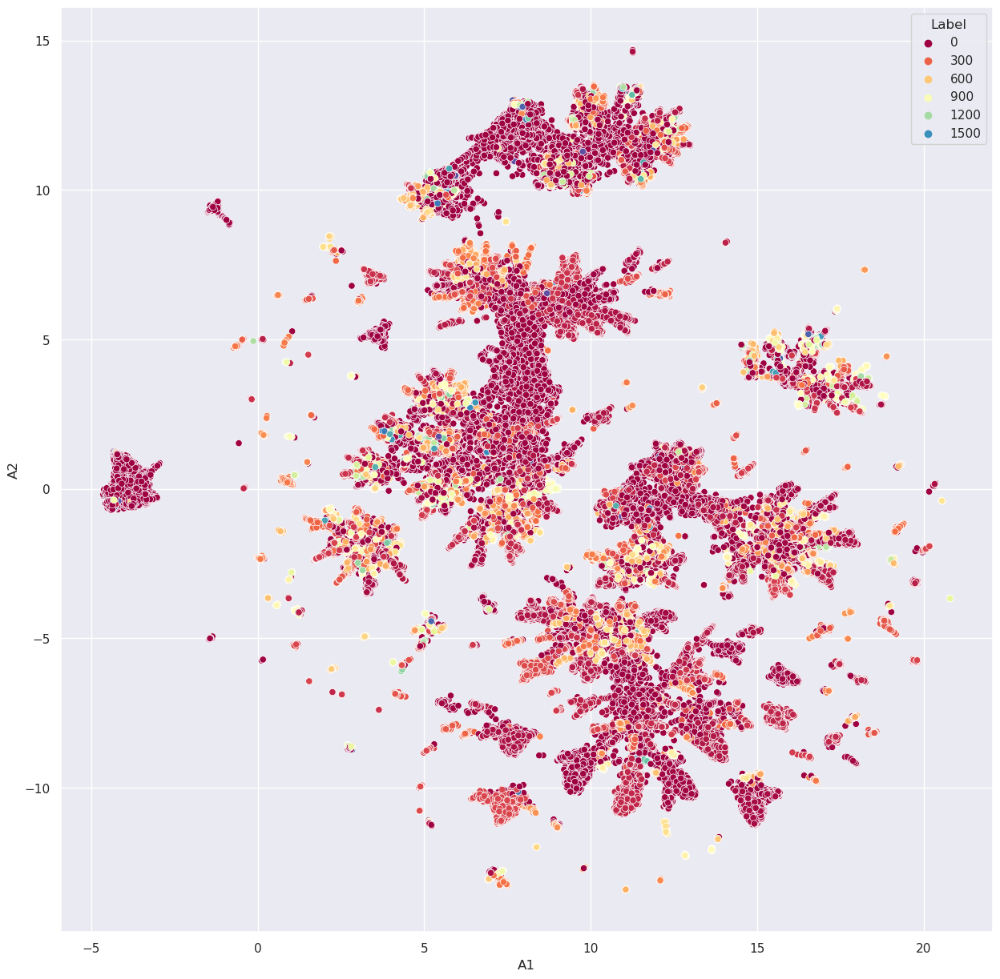

In [439]:
# Representation of DBSCAN with UMAP:

sns.set(rc = {'figure.figsize':(15,15)})
sns.scatterplot(data = reduced_df, x = "A1", y = "A2", hue = "Label", palette="Spectral")

In [440]:
#################################
#################################
#################################
#################################
#################################

In [375]:
# Interpretation of the results: We start with DBSCAN x UMAP: 

# 1. Find the points corresponding to frands : 

# Idea: try to identify the types of transactions related to each cluster. 

# What value corresponds to an online transaction?

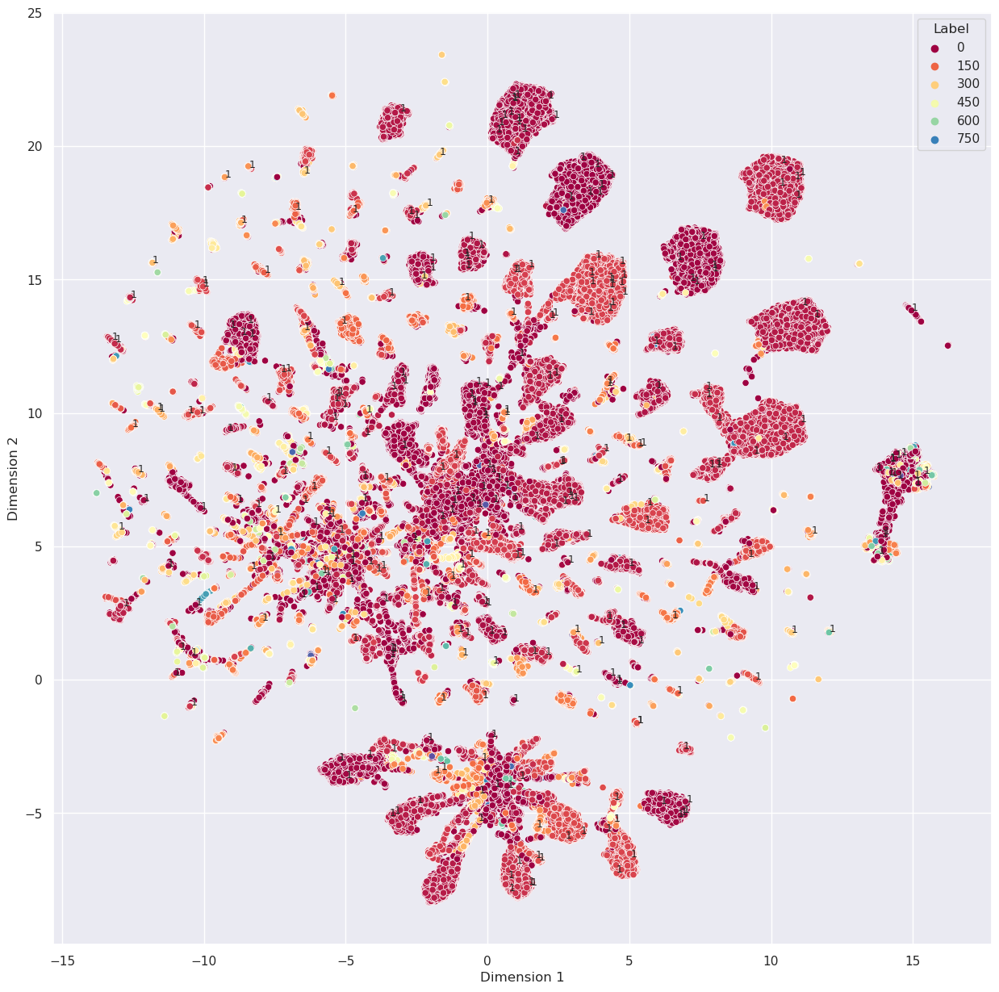

In [46]:
val = df_cct["Online Transaction"].unique()[1]

reduced_dfbis = pd.concat([reduced_df, df_cct["Online Transaction"]], axis = 1)

fig, ax = plt.subplots(figsize=(15, 15))
sns.scatterplot(data = reduced_dfbis, x = "A1", y = "A2", hue = "Label", palette="Spectral")

for k in reduced_dfbis.iterrows():
    if (k[1]['Online Transaction'] == val) :
        ax.annotate("1", (k[1]['A1'], k[1]['A2']), fontsize = 9)
plt.xlabel("Dimension 1") 
plt.ylabel("Dimension 2")
plt.show()

# There are a few everywhere: Slices: yellow orange. 

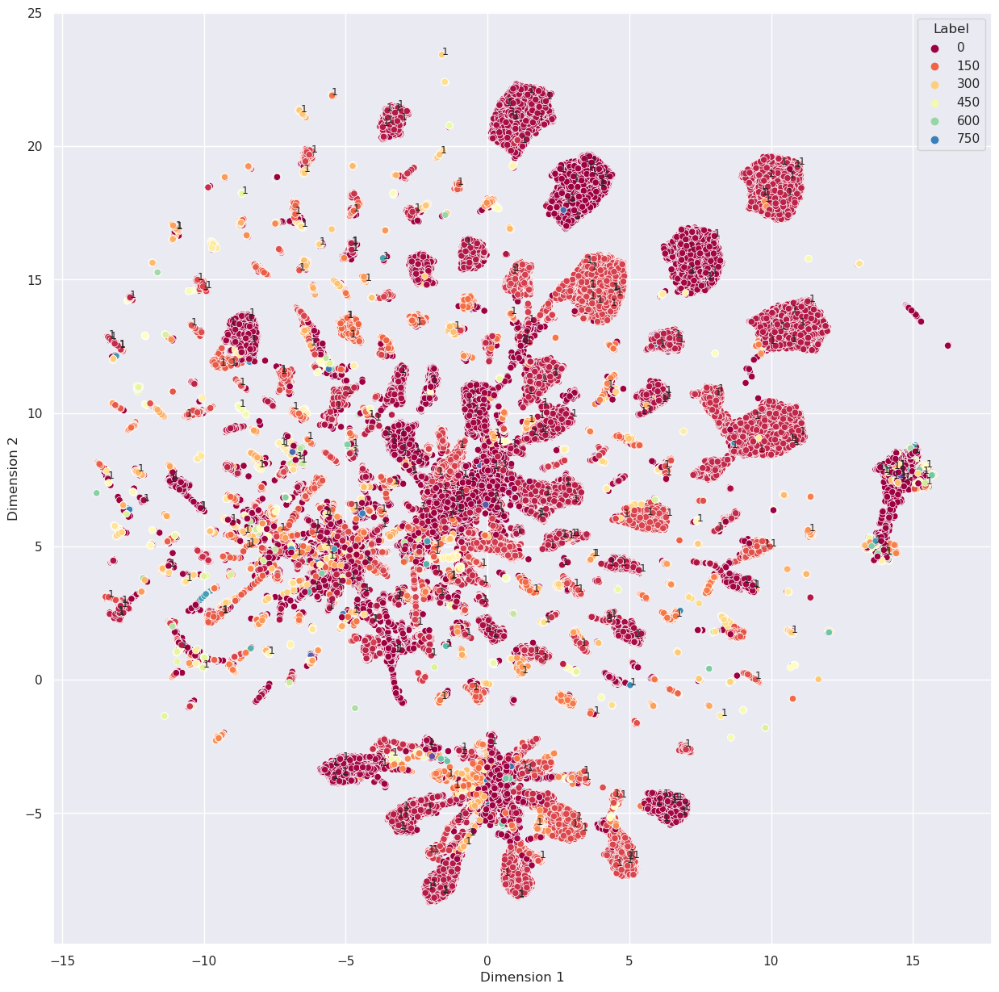

In [47]:
# Let's try for the other transaction types:

reduced_dfbis = pd.concat([reduced_df, df_cct["Chip Transaction"]], axis = 1)

val = df_cct["Chip Transaction"].unique()[1]

fig, ax = plt.subplots(figsize=(15, 15))
sns.scatterplot(data = reduced_dfbis, x = "A1", y = "A2", hue = "Label", palette="Spectral")

for k in reduced_dfbis.iterrows():
    if (k[1]["Chip Transaction"] == val) :
        ax.annotate("1", (k[1]['A1'], k[1]['A2']), fontsize = 9)
plt.xlabel("Dimension 1") 
plt.ylabel("Dimension 2")
plt.show()

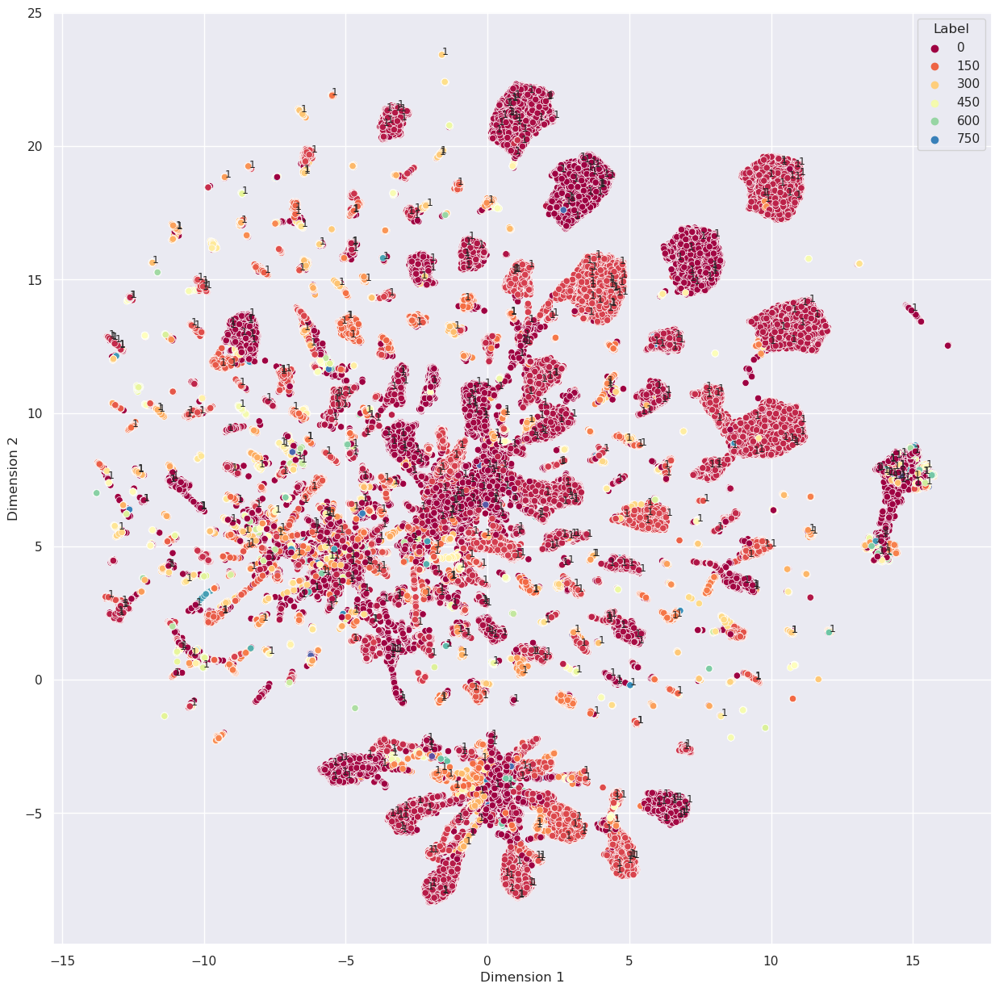

In [48]:
reduced_dfbis = pd.concat([reduced_df, df_cct["Swipe Transaction"]], axis = 1)

val = df_cct["Swipe Transaction"].unique()[1]

fig, ax = plt.subplots(figsize=(15, 15))
sns.scatterplot(data = reduced_dfbis, x = "A1", y = "A2", hue = "Label", palette="Spectral")


for k in reduced_dfbis.iterrows():
    if (k[1]["Swipe Transaction"] == val) :
        ax.annotate("1", (k[1]['A1'], k[1]['A2']), fontsize = 9)
plt.xlabel("Dimension 1") 
plt.ylabel("Dimension 2")
plt.show()

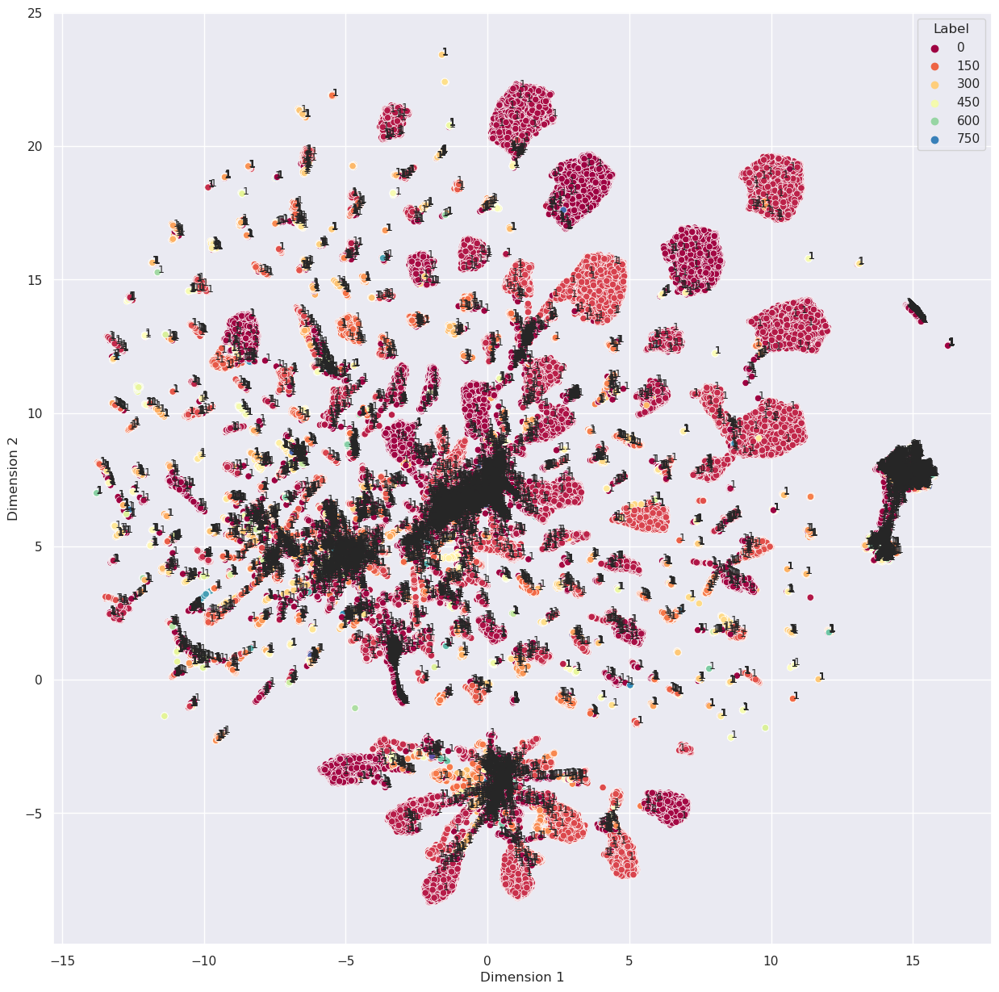

In [49]:
# Find the outliers: 

fig, ax = plt.subplots(figsize=(15, 15))
sns.scatterplot(data = reduced_dfbis, x = "A1", y = "A2", hue = "Label", palette="Spectral")

for k in reduced_dfbis.iterrows():
    if (k[1]["Label"] == -1) :
        ax.annotate("1", (k[1]['A1'], k[1]['A2']), fontsize = 9)
plt.xlabel("Dimension 1") 
plt.ylabel("Dimension 2")
plt.show()


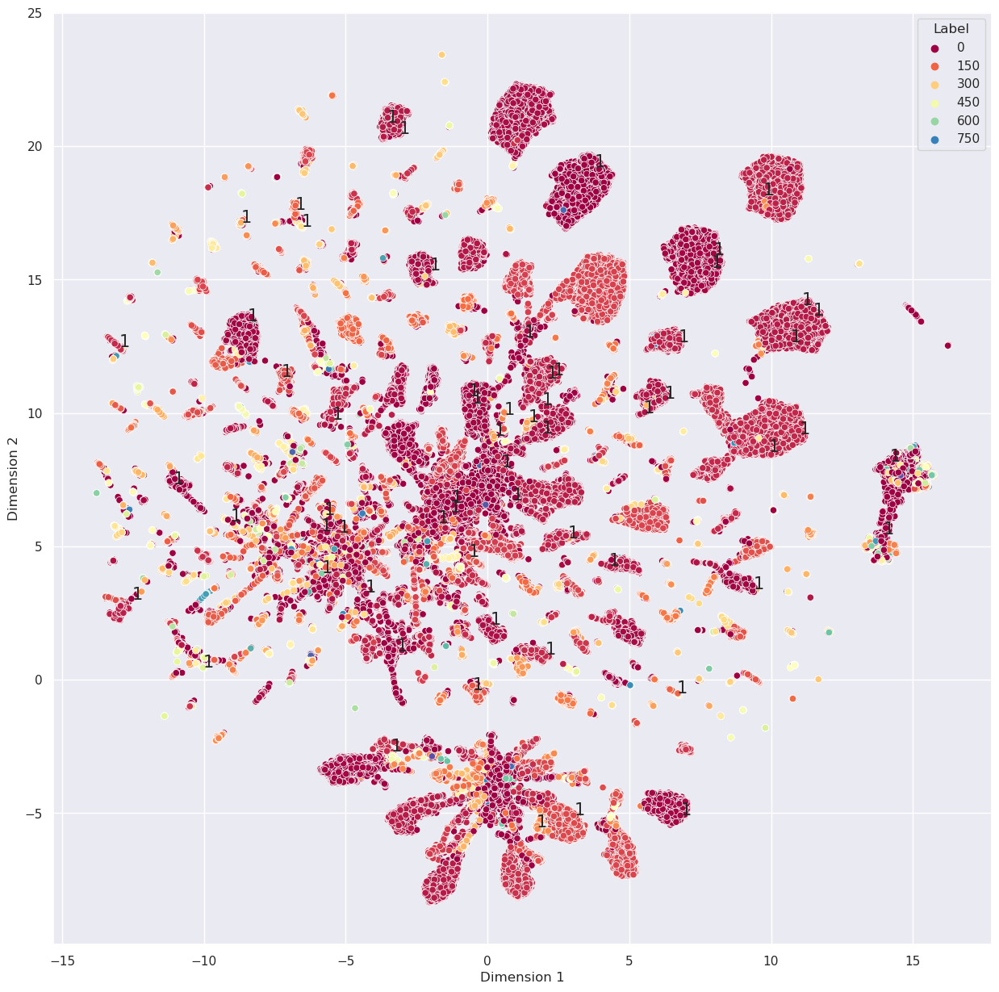

In [50]:
# Find the frauds:
 
reduced_dfbis = pd.concat([reduced_df, df_cct["Is Fraud?"]], axis = 1)

val = df_cct["Is Fraud?"].unique()[1]

fig, ax = plt.subplots(figsize=(15, 15))
sns.scatterplot(data = reduced_dfbis, x = "A1", y = "A2", hue = "Label", palette="Spectral")

for k in reduced_dfbis.iterrows():
    if (k[1]["Is Fraud?"] == val) :
        ax.annotate("1", (k[1]['A1'], k[1]['A2']), fontsize = 15)
plt.xlabel("Dimension 1") 
plt.ylabel("Dimension 2")
plt.show()

In [51]:
# 1. Interpret UMAP => do UMAP only on 2 3 variables => try to interpret the axes. Do it several times. 

# 2. For PCA (don't spend too much time on it) Look at correlation matrix, correlated variables often represent an axis, a package.

In [19]:
# Interpret UMAP => do UMAP only on 2 3 variables => 
# Try to interpret the axes. Do it several times.

df_sub = df_cct[['amt/daily_income', 'daily_amount', 'last_3d_amt/nbt', 'Amount']] 

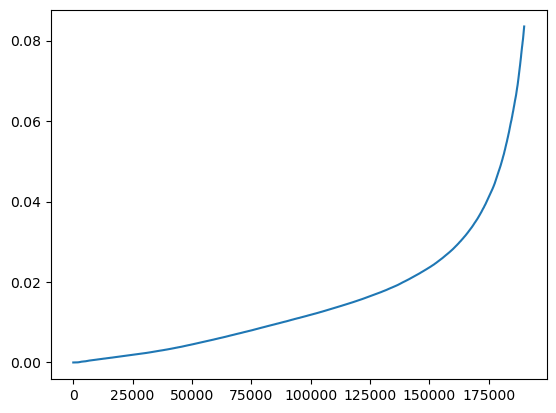

In [20]:
%matplotlib inline
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
import numpy as np

# DBSCAN

X = df_sub.values
X.astype(np.float64)

neigh = NearestNeighbors(n_neighbors=5)
nbrs = neigh.fit(X)
distances, indices = nbrs.kneighbors(X)
distances = np.sort(distances, axis=0)
distances = distances[:190000,1]
plt.plot(distances);

In [21]:
clustering=cluster.DBSCAN(eps=0.06, min_samples=5, n_jobs = -1)
clustering.fit(X)
len(np.unique(clustering.labels_))

# Nbr of clusters: 

563

<AxesSubplot: xlabel='A1', ylabel='A2'>

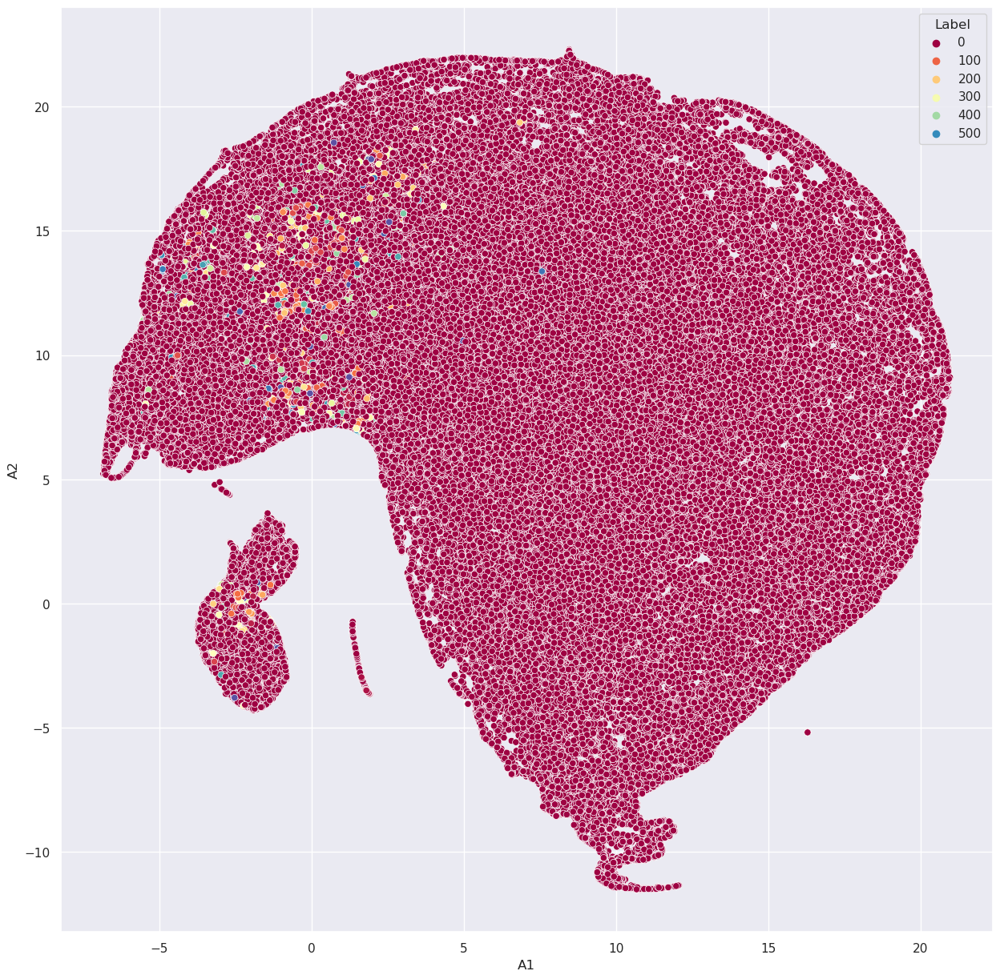

In [22]:
# UMAP

reducer = umap.UMAP()
reduced_X = reducer.fit_transform(df_sub.values)
reduced_df = pd.DataFrame(reduced_X, columns = ["A1", "A2"])
reduced_df["Label"] = clustering.labels_

# Representation of DBSCAN with UMAP:

sns.set(rc = {'figure.figsize':(15,15)})
sns.scatterplot(data = reduced_df, x = "A1", y = "A2", hue = "Label", palette="Spectral")


In [23]:
# Take an amount variable and a low transaction frequency variable:

df_sub1 = df_cct[['Amount', 'delta_t_s']] 
df_sub1.describe()

,Amount,delta_t_s
count,2.000000e+05,2.000000e+05
mean,-4.142464e-17,-3.197442e-18
std,1.000003e+00,1.000003e+00
min,-5.887323e+00,-3.062027e-01
25%,-4.039523e-01,-2.778993e-01
50%,-1.684048e-01,-1.633995e-01
75%,2.306965e-01,1.530831e-01
max,6.079847e+01,3.075774e+02


In [24]:
# DBSCAN:

X = df_sub1.values
X.astype(np.float64)

array([[ 0.25467652,  0.07524899],
       [-0.42602147,  0.26822622],
       [-0.43366492,  0.56219486],
       ...,
       [-0.47608071, -0.1441018 ],
       [-0.13438604,  0.38915862],
       [-0.48146342, -0.269537  ]])

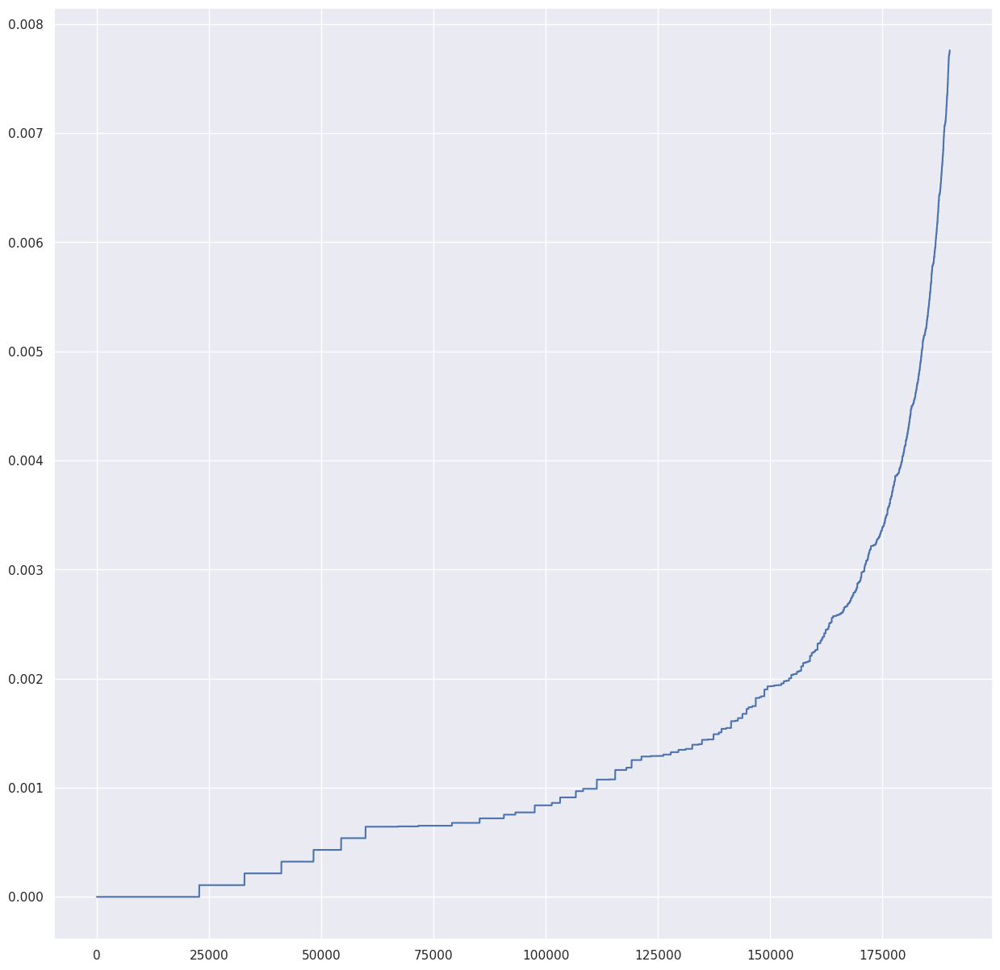

In [25]:
%matplotlib inline
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
import numpy as np

neigh = NearestNeighbors(n_neighbors=5)
nbrs = neigh.fit(X)
distances, indices = nbrs.kneighbors(X)
distances = np.sort(distances, axis=0)
distances = distances[:190000,1]
plt.plot(distances);

In [26]:
clustering=cluster.DBSCAN(eps=0.005, min_samples=5, n_jobs = -1)
clustering.fit(X)
len(np.unique(clustering.labels_))
# Nbr of clusters : 

1334

<AxesSubplot: xlabel='A1', ylabel='A2'>

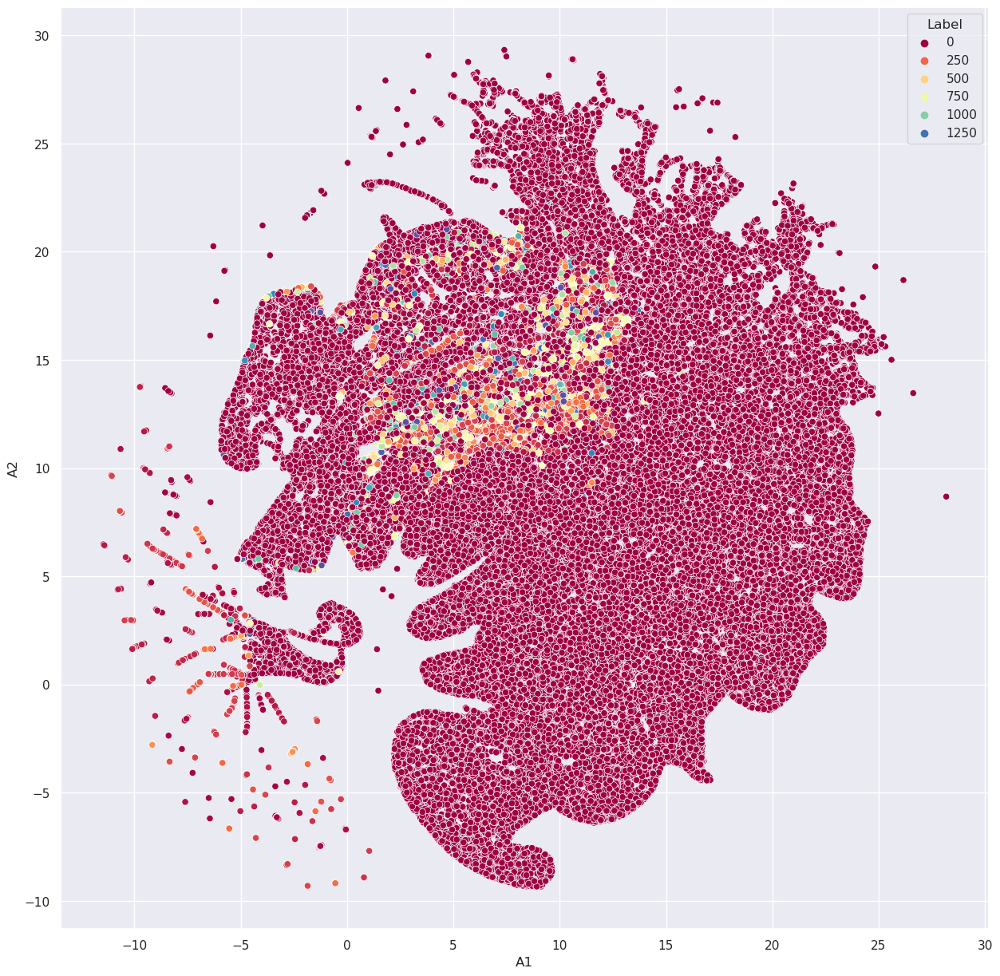

In [27]:
# UMAP

reducer = umap.UMAP()
reduced_X = reducer.fit_transform(df_sub1.values)
reduced_df = pd.DataFrame(reduced_X, columns = ["A1", "A2"])
reduced_df["Label"] = clustering.labels_

# Representation of DBSCAN with UMAP:

sns.set(rc = {'figure.figsize':(15,15)})
sns.scatterplot(data = reduced_df, x = "A1", y = "A2", hue = "Label", palette="Spectral")

In [34]:
# Take an amount variable and a low transaction frequency variable:

df_sub2 = df_cct[['Amount', 'Chip Transaction', 'Online Transaction',
       'Swipe Transaction', 'delta_t_s' ]] 
df_sub2.describe()

,Amount,Chip Transaction,Online Transaction,Swipe Transaction,delta_t_s
count,2.000000e+05,200000.000000,200000.000000,200000.000000,2.000000e+05
mean,-4.142464e-17,0.253440,0.136035,0.610525,-3.197442e-18
std,1.000003e+00,0.434982,0.342827,0.487632,1.000003e+00
min,-5.887323e+00,0.000000,0.000000,0.000000,-3.062027e-01
25%,-4.039523e-01,0.000000,0.000000,0.000000,-2.778993e-01
50%,-1.684048e-01,0.000000,0.000000,1.000000,-1.633995e-01
75%,2.306965e-01,1.000000,0.000000,1.000000,1.530831e-01
max,6.079847e+01,1.000000,1.000000,1.000000,3.075774e+02


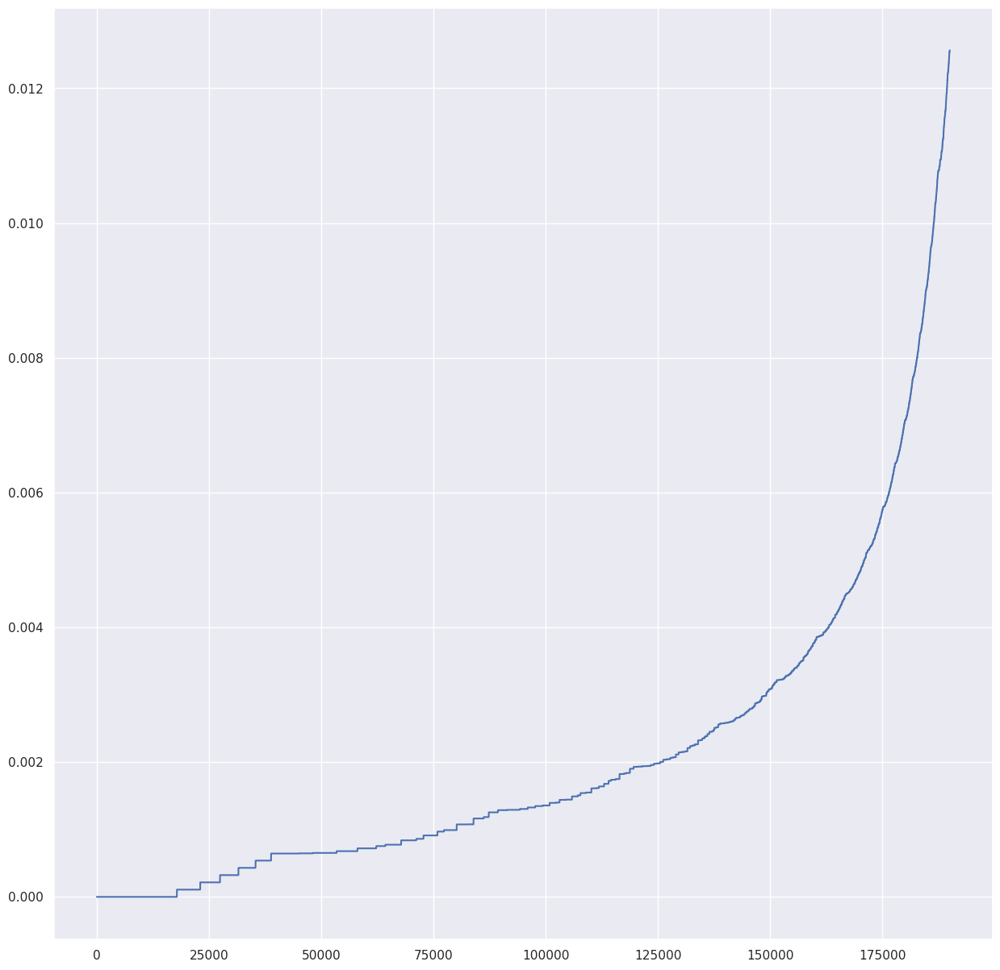

In [35]:
# DBSCAN

X = df_sub2.values
X.astype(np.float64)

%matplotlib inline
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
import numpy as np

neigh = NearestNeighbors(n_neighbors=5)
nbrs = neigh.fit(X)
distances, indices = nbrs.kneighbors(X)
distances = np.sort(distances, axis=0)
distances = distances[:190000,1]
plt.plot(distances);

In [36]:
clustering=cluster.DBSCAN(eps=0.012, min_samples=5, n_jobs = -1)
clustering.fit(X)
len(np.unique(clustering.labels_))

809

<AxesSubplot: xlabel='A1', ylabel='A2'>

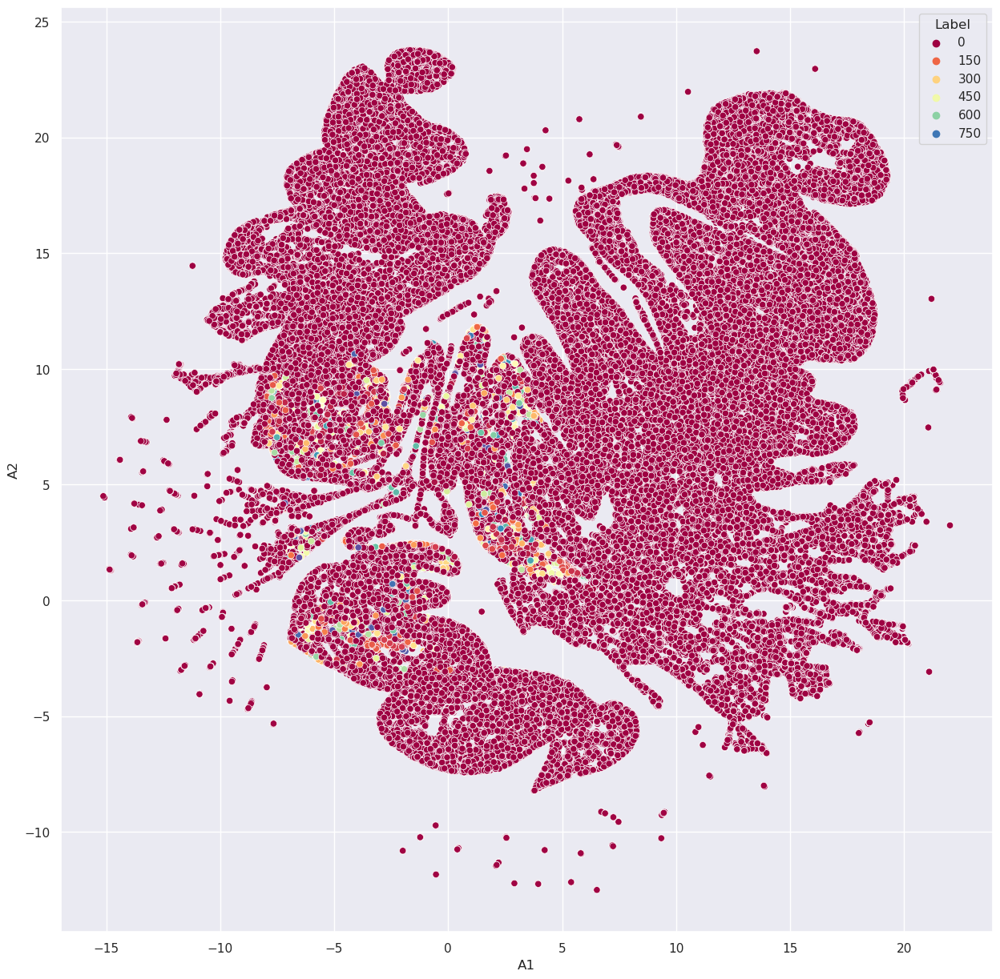

In [37]:
# UMAP

reducer = umap.UMAP()
reduced_X = reducer.fit_transform(df_sub2.values)
reduced_df = pd.DataFrame(reduced_X, columns = ["A1", "A2"])
reduced_df["Label"] = clustering.labels_

# Representation of DBSCAN with UMAP : 

sns.set(rc = {'figure.figsize':(15,15)})
sns.scatterplot(data = reduced_df, x = "A1", y = "A2", hue = "Label", palette="Spectral")

In [38]:
# It takes a long time to generate => about 1 hour...
# Results not very conclusive...

a


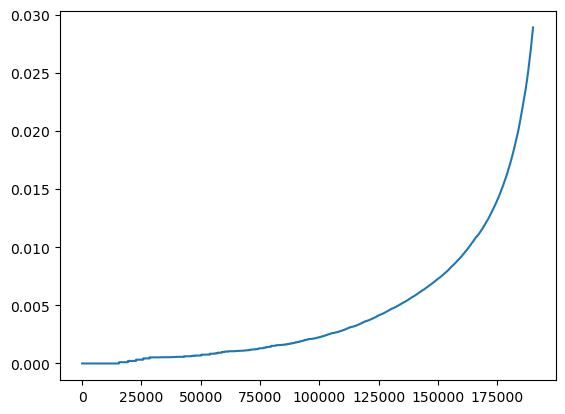

In [19]:
df_sub3 = df_cct[['Amount', 'delta_t_s', "delta_t_s_card", 'nb_daily_declines_card']] 
df_sub3.describe()

# DBSCAN

X = df_sub3.values
X.astype(np.float64)

%matplotlib inline
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
import numpy as np

neigh = NearestNeighbors(n_neighbors=5)
nbrs = neigh.fit(X)
distances, indices = nbrs.kneighbors(X)
distances = np.sort(distances, axis=0)
distances = distances[:190000,1]
plt.plot(distances);


In [20]:
clustering=cluster.DBSCAN(eps=0.025, min_samples=5, n_jobs = -1)
clustering.fit(X)
len(np.unique(clustering.labels_))

565

<AxesSubplot: xlabel='A1', ylabel='A2'>

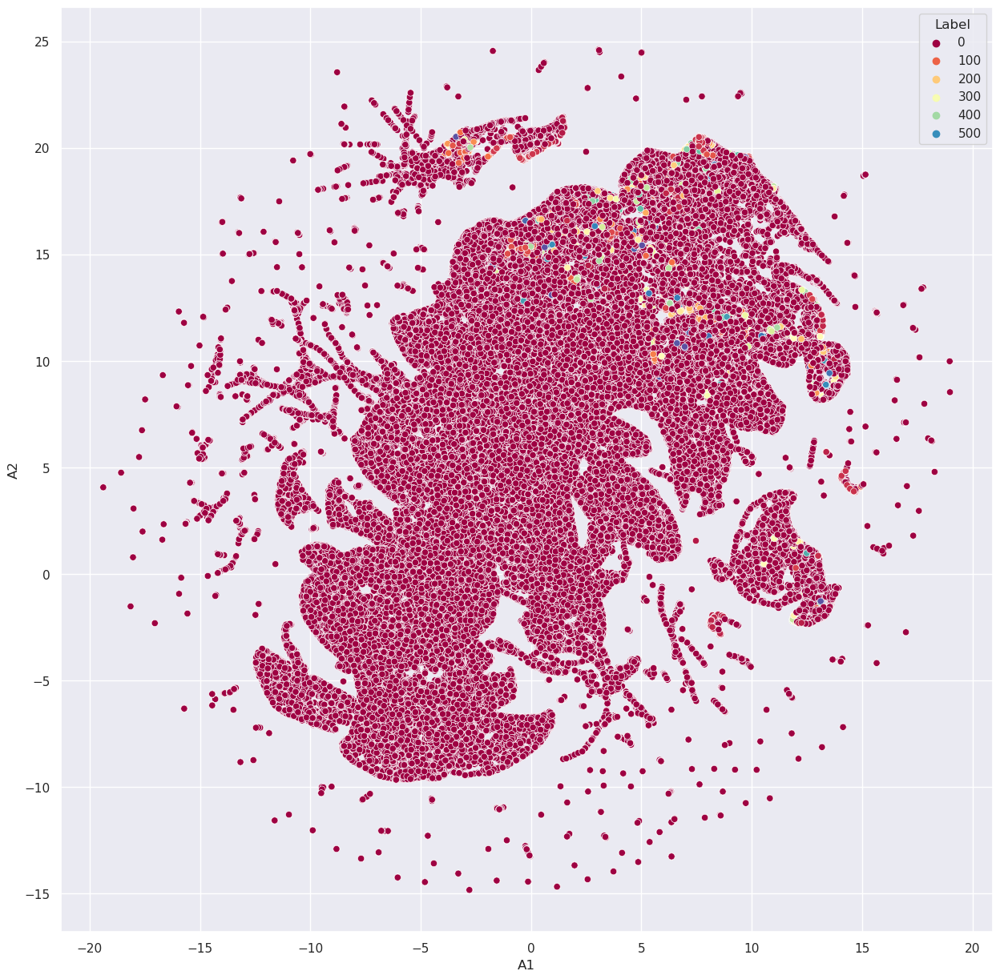

In [21]:
# UMAP

reducer = umap.UMAP()
reduced_X = reducer.fit_transform(df_sub3.values)
reduced_df = pd.DataFrame(reduced_X, columns = ["A1", "A2"])
reduced_df["Label"] = clustering.labels_

# Representation of DBSCAN with UMAP :

sns.set(rc = {'figure.figsize':(15,15)})
sns.scatterplot(data = reduced_df, x = "A1", y = "A2", hue = "Label", palette="Spectral")

In [ ]:
# Not very useful.  

#################################
#################################
#################################
#################################

# Let's try something else:

In [35]:
df_cct_cluster =  pd.concat([df_cct, pd.DataFrame( clustering.labels_ ,columns = ["Label_Cluster"], index = df_cct.index)], axis = 1)

In [442]:
df_cct_cluster.head()

,Amount,Credit Limit,delta_t_s,delta_t_s_card,amt/daily_income,Retired,daily_amount,nb_daily_declines_card,nb_weekly_declines_card,nb_monthly_declines_card,...,Tuesday,Wednesday,Amex,Discover,Mastercard,Visa,Credit,Debit,Debit (Prepaid),Label_Cluster
1520542,-0.243258,-0.221707,0.160055,0.155982,-0.008945,0,-0.568225,-0.196409,-0.432289,-0.053541,...,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0
15037871,0.354731,9.622495,-0.143618,-0.121834,-0.008893,0,0.162030,-0.196409,-0.432289,-0.655329,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,-1
20449334,-0.204547,-1.002871,0.280671,0.037687,-0.008959,0,-0.549038,-0.196409,-0.432289,-0.053541,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1
23040696,0.074237,0.852031,-0.016301,-0.073967,-0.008947,0,-0.370264,-0.196409,-0.432289,0.548247,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2
23773610,-0.231709,-0.961241,-0.129912,-0.116681,-0.008983,0,-0.380812,-0.196409,-0.432289,1.150035,...,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,-1


In [36]:
df_cct_cluster["Label_Cluster"].unique()

array([  0,  -1,   1,   2,   3,   8,   4,   5,   6, 226,   7,  16,   9,
        97, 183,  10,  11,  12, 199, 157, 207,  13,  14,  99,  15, 175,
       177,  87,  56,  32, 125, 201,  17,  72, 229,  18, 210, 111,  80,
        19, 202,  91, 215,  20, 136,  74,  60,  21, 182, 214,  22, 194,
       240, 213,  62,  44,  33, 140,  23,  24,  25, 104, 131, 146,  26,
        27, 181,  28,  30,  79,  29, 124,  41, 160,  31, 148, 195, 137,
       120,  34, 135,  35, 219,  36, 142, 112,  63, 101,  37,  38,  65,
        39, 145, 216,  53,  40,  42,  43, 184, 127, 223, 185, 187,  45,
       230, 232, 155,  46, 122, 119, 154, 221,  70, 169,  47, 162, 227,
       228, 138,  48,  50,  49,  73, 105,  86,  55,  51, 231,  52, 242,
        54, 117,  57,  58,  59,  90,  81, 147,  61, 151, 220, 211, 144,
        64,  66, 132,  67, 133,  85, 123, 196,  68,  69,  71,  89, 190,
        75,  76,  77,  78, 171, 107, 224, 206, 239, 126, 205, 108,  82,
        83,  84, 204, 172,  95, 115, 236,  88, 156, 197, 141, 17

In [46]:
count = df_cct_cluster.groupby(['Label_Cluster']).count().sort_index(ascending = False)["Amount"]

In [37]:
df_cct_mean = df_cct_cluster.groupby(['Label_Cluster']).mean().sort_index(ascending = False)

In [38]:
df_cct_mean.head()

,Amount,Credit Limit,delta_t_s,delta_t_s_card,amt/daily_income,Retired,daily_amount,nb_daily_declines_card,nb_weekly_declines_card,nb_monthly_declines_card,...,Thursday,Tuesday,Wednesday,Amex,Discover,Mastercard,Visa,Credit,Debit,Debit (Prepaid)
Label_Cluster,,,,,,,,,,,,,,,,,,,,,
242,-0.434795,-0.368112,-0.019629,-0.106699,-0.010882,0.2,-0.174480,4.263407,1.215603,0.070058,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
241,-0.183406,-0.449801,0.030948,-0.052724,-0.010713,0.0,-0.543994,-0.196714,1.215603,0.352766,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
240,0.315260,0.773710,-0.047320,-0.213679,-0.010605,0.0,0.582992,-0.196714,2.862840,1.645145,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
239,0.250898,-0.371402,0.013243,-0.046216,-0.010471,0.0,-0.284648,-0.196714,2.862840,2.250947,...,0.8,0.2,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
238,3.629218,-0.486204,-0.020459,-0.158441,-0.007357,0.0,1.695291,-0.196714,-0.431634,-0.414584,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [39]:
df_cct_std = df_cct_cluster.groupby(['Label_Cluster']).std().sort_index(ascending = False)

In [40]:
df_cct_std.columns = df_cct_std.columns + str("var")

In [44]:
reducer = umap.UMAP()
reduced_X = reducer.fit_transform(df_cct_mean.values)

In [47]:
reduced_df = pd.DataFrame(reduced_X, columns = ["A1", "A2"])
reduced_df["Count"] = count.values
reduced_df["Label"] = df_cct_mean.index.values
reduced_df["Amount_mean"] = df_cct_mean["Amount"]


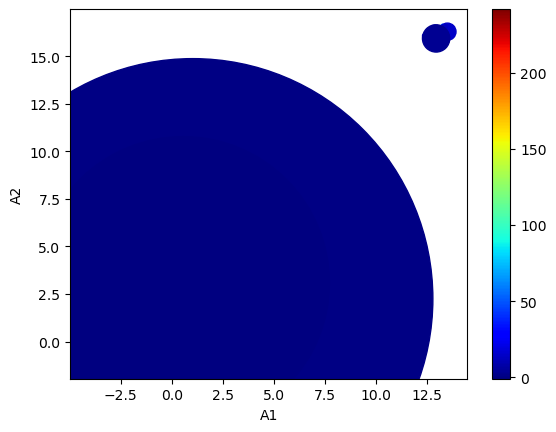

In [48]:
from matplotlib import pyplot as plt

plt.scatter('A1', 'A2', c='Label', s='Count', data=reduced_df,  cmap='jet')

plt.xlabel('A1')

plt.ylabel('A2')

cbar= plt.colorbar()

plt.show()

In [451]:
import plotly.express as px

fig = px.scatter(reduced_df, x="A1", y="A2", color="Label",
                 size='Count', size_max=200, hover_name = "Amount_mean", height = 800, width = 800)
fig.show()

In [452]:
df_cct_cluster.groupby(['Label_Cluster']).count().sort_values(by = "Amount", ascending = False).head(20)

,Amount,Credit Limit,delta_t_s,delta_t_s_card,amt/daily_income,Retired,daily_amount,nb_daily_declines_card,nb_weekly_declines_card,nb_monthly_declines_card,...,Thursday,Tuesday,Wednesday,Amex,Discover,Mastercard,Visa,Credit,Debit,Debit (Prepaid)
Label_Cluster,,,,,,,,,,,,,,,,,,,,,
-1,52989,52989,52989,52989,52989,52989,52989,52989,52989,52989,...,52989,52989,52989,52989,52989,52989,52989,52989,52989,52989
1,2595,2595,2595,2595,2595,2595,2595,2595,2595,2595,...,2595,2595,2595,2595,2595,2595,2595,2595,2595,2595
30,2542,2542,2542,2542,2542,2542,2542,2542,2542,2542,...,2542,2542,2542,2542,2542,2542,2542,2542,2542,2542
13,2531,2531,2531,2531,2531,2531,2531,2531,2531,2531,...,2531,2531,2531,2531,2531,2531,2531,2531,2531,2531
193,2530,2530,2530,2530,2530,2530,2530,2530,2530,2530,...,2530,2530,2530,2530,2530,2530,2530,2530,2530,2530
46,2529,2529,2529,2529,2529,2529,2529,2529,2529,2529,...,2529,2529,2529,2529,2529,2529,2529,2529,2529,2529
65,2525,2525,2525,2525,2525,2525,2525,2525,2525,2525,...,2525,2525,2525,2525,2525,2525,2525,2525,2525,2525
107,2464,2464,2464,2464,2464,2464,2464,2464,2464,2464,...,2464,2464,2464,2464,2464,2464,2464,2464,2464,2464
15,1408,1408,1408,1408,1408,1408,1408,1408,1408,1408,...,1408,1408,1408,1408,1408,1408,1408,1408,1408,1408


In [453]:
df_important = df_cct_cluster.groupby(['Label_Cluster']).count()[df_cct_cluster.groupby(['Label_Cluster']).count()["Amount"] > 1000]